In [1]:
import numpy as np
import matplotlib.pyplot as plt
from funciones import *

""" import os
os.environ["OMP_NUM_THREADS"] = "2" #Máximo número de hilos

import cv2
cv2.setNumThreads(2)  # Limita a 2 hilos """

' import os\nos.environ["OMP_NUM_THREADS"] = "2" #Máximo número de hilos\n\nimport cv2\ncv2.setNumThreads(2)  # Limita a 2 hilos '

In [ ]:
# carga de las imagenes

ruta_imagenes = "../img"
clases = ['normal', 'grieta', 'hueco']

df = load_images(img_directorio_path=ruta_imagenes, classes=clases)

# Se va a realizar un exploratorio con alguna combinación para ver las métricas obtenidas del modelo XGBoost:

In [5]:
huecos = list(df[df['clase'] == 'hueco']['imagen gris'])
grietas = list(df[df['clase'] == 'grieta']['imagen gris'])
normal = list(df[df['clase'] == 'normal']['imagen gris'])

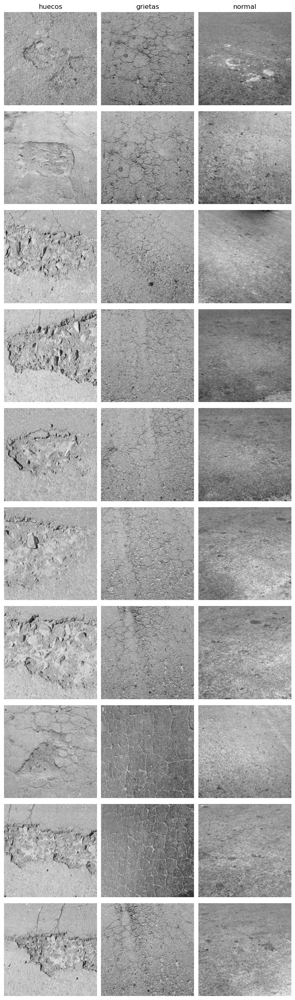

In [6]:
# Graficamos algunas de las imagenes en escala de grises
inicio = 160
final = inicio + 10
graficar = [
    huecos[inicio:final],
    grietas[inicio:final],
    normal[inicio:final],
]

nombres = ['huecos', 'grietas', 'normal']

show_images(graficar, nombres, size=2.5)

## Probamos con varios ajustes de brillo para un contrase definido de 6

Huecos


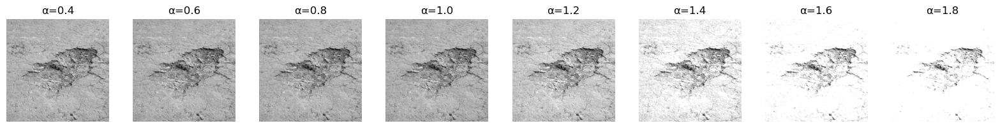

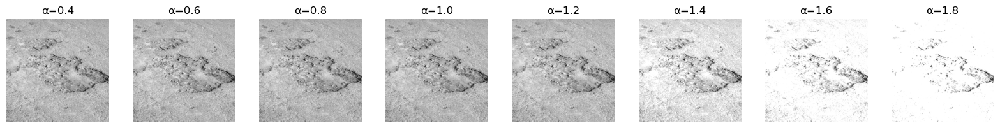

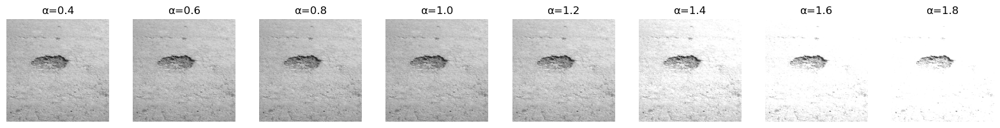

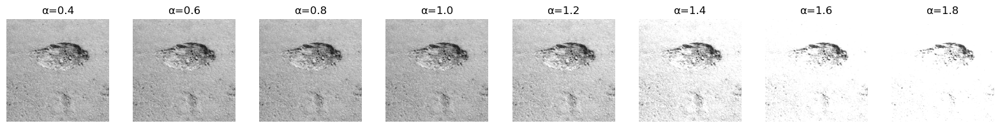

Grietas


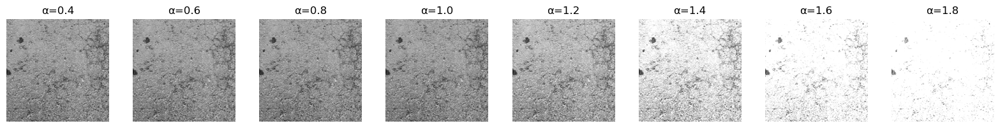

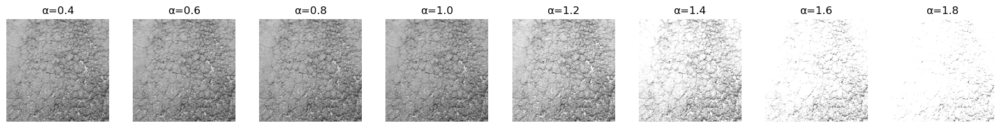

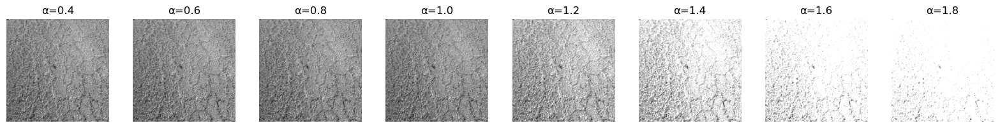

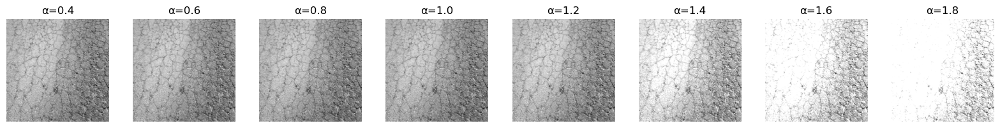

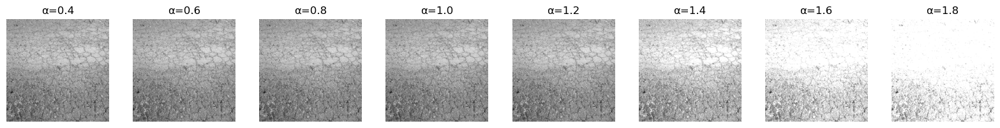

Normal


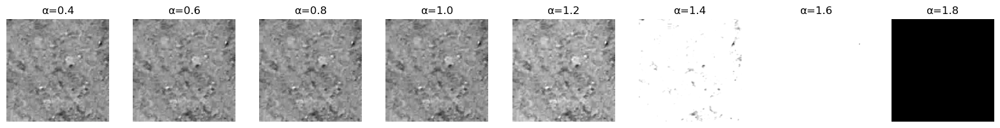

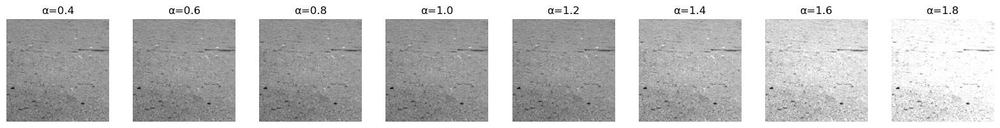

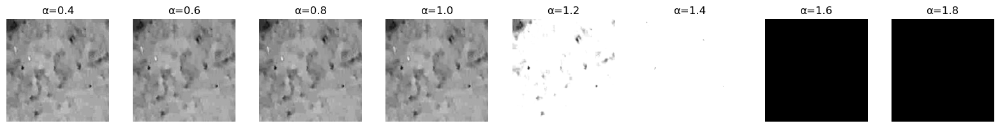

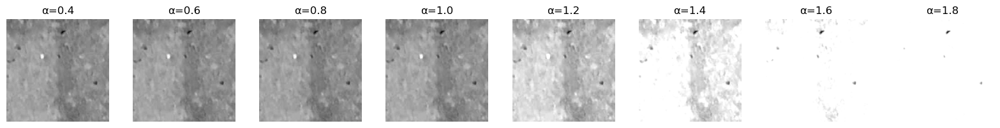

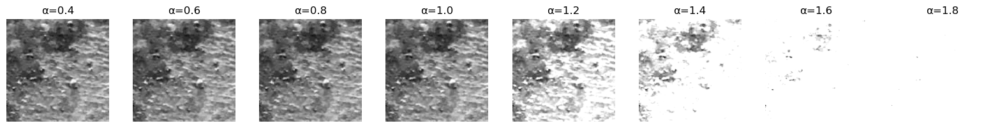

In [7]:
# Valores de alpha y beta
alpha_values = [x for x in np.arange(0.4, 2, 0.2) if x != 0]
beta_value = 6


print("Huecos")
for i in range(10, 50, 10):
    imagenes_por_alpha = [[cv2.convertScaleAbs(huecos[i], alpha=alpha, beta=beta_value)] for alpha in alpha_values]
    nombres_alpha = [f'α={round(alpha, 3)}' for alpha in alpha_values]
    show_images(imagenes_por_alpha, nombres_alpha)

print("Grietas")
for i in range(60, 110, 10):
    imagenes_por_alpha = [[cv2.convertScaleAbs(grietas[i], alpha=alpha, beta=beta_value)] for alpha in alpha_values]
    nombres_alpha = [f'α={round(alpha, 3)}' for alpha in alpha_values]
    show_images(imagenes_por_alpha, nombres_alpha)

print("Normal")
for i in range(600, 650, 10):
    imagenes_por_alpha = [[cv2.convertScaleAbs(normal[i], alpha=alpha, beta=beta_value)] for alpha in alpha_values]
    nombres_alpha = [f'α={round(alpha, 3)}' for alpha in alpha_values]
    show_images(imagenes_por_alpha, nombres_alpha)

## Para el análisis siguiente, se definió un alpha de 1.1 y un beta de 6 para transformación de brillo y contraste

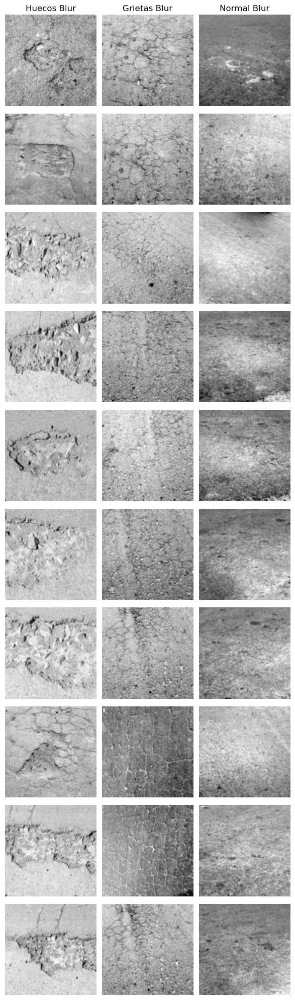

In [8]:
#generamos un blur Gaussiano para reducir el ruido de las imagenes
def gaussian_blur(imagen):
    imagen = cv2.convertScaleAbs(imagen, alpha=1, beta=6)
    return cv2.GaussianBlur(imagen, (5, 5), 0)

# Aplicar blur a cada clase
imagen_huecos_blur = [gaussian_blur(imagen) for imagen in huecos]
imagen_grietas_blur = [gaussian_blur(imagen) for imagen in grietas]
imagen_normal_blur = [gaussian_blur(imagen) for imagen in normal]

# Agrupar en una lista por clase
imagenes_blur = [imagen_huecos_blur[inicio:final], imagen_grietas_blur[inicio:final], imagen_normal_blur[inicio:final]]

# Nombres de las clases
nombres = ['Huecos Blur', 'Grietas Blur', 'Normal Blur']

# Mostrar 
show_images(imagenes_blur, nombres)


## De la exploración previa, el filtro que mejor detallaba los huecos y grietas era el de Sobel, por eso se sigue el análisis con este. Además, se va a mirar umbrales con Canny, Otsu y Laplacian

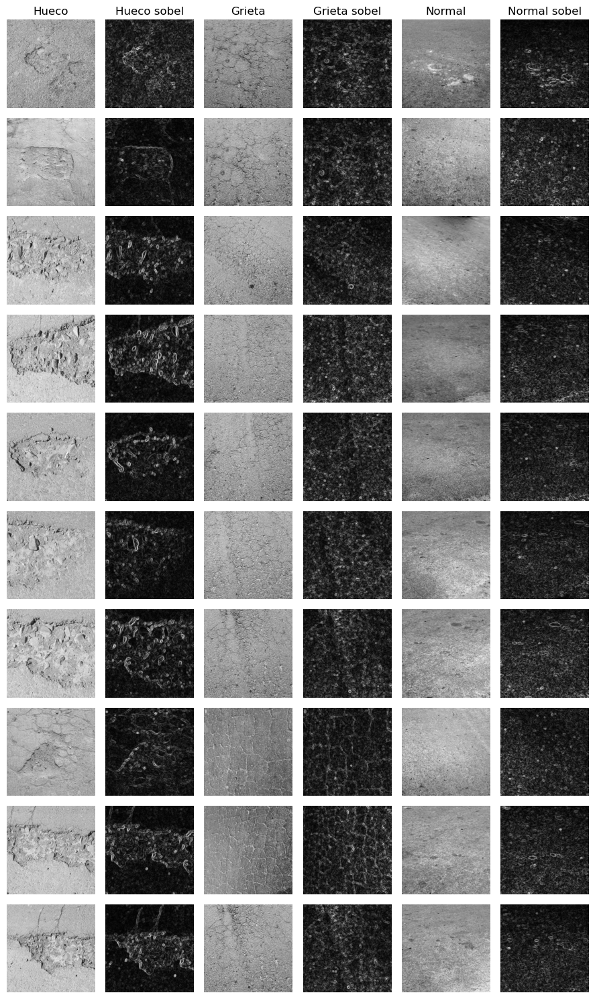

In [ ]:
# Realizamos filtros sobel para detectar bordes
def sobel(imagen):
    sobelx = cv2.Sobel(imagen, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(imagen, cv2.CV_64F, 0, 1)
    return cv2.magnitude(sobelx, sobely)

# Aplicamos Sobel a cada conjunto de imágenes
imagen_huecos_sobel = [sobel(imagen) for imagen in imagen_huecos_blur]
imagen_grietas_sobel = [sobel(imagen) for imagen in imagen_grietas_blur]
imagen_normal_sobel = [sobel(imagen) for imagen in imagen_normal_blur]


mostrar = [huecos[inicio:final], imagen_huecos_sobel[inicio:final],
           grietas[inicio:final], imagen_grietas_sobel[inicio:final],
           normal[inicio:final], imagen_normal_sobel[inicio:final]]

nombres = ['Hueco', 'Hueco sobel', 'Grieta', 'Grieta sobel', 'Normal', 'Normal sobel']

show_images(mostrar, nombres, size=1.5)


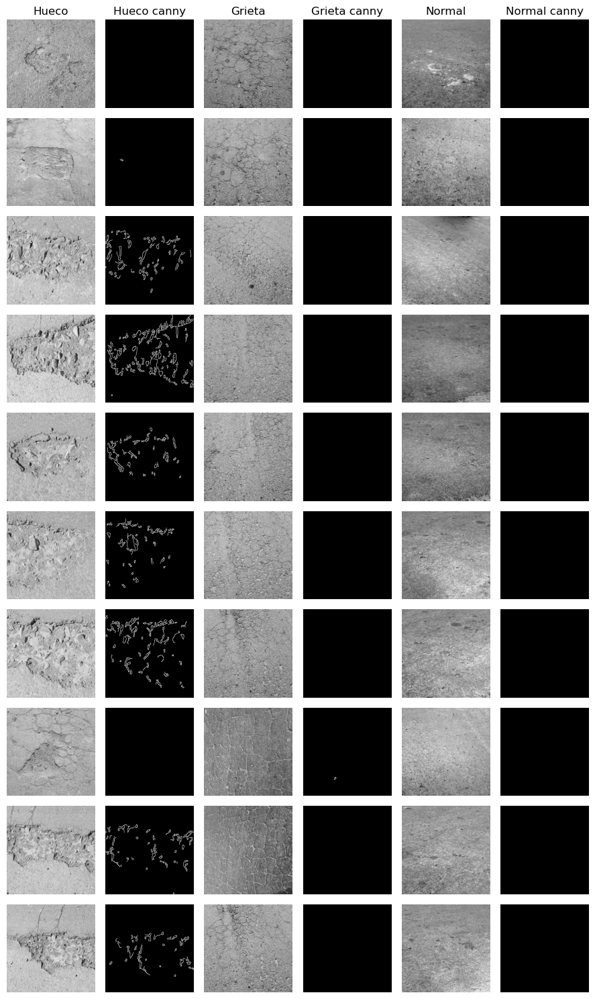

In [14]:
def canny(imagen):
    return cv2.Canny(imagen, 100, 300)

# Aplicamos Canny a cada conjunto de imágenes
imagen_huecos_canny = [canny(imagen) for imagen in imagen_huecos_blur]
imagen_grietas_canny = [canny(imagen) for imagen in imagen_grietas_blur]
imagen_normal_canny = [canny(imagen) for imagen in imagen_normal_blur]


mostrar = [huecos[inicio:final], imagen_huecos_canny[inicio:final],
           grietas[inicio:final], imagen_grietas_canny[inicio:final],
           normal[inicio:final], imagen_normal_canny[inicio:final]]

nombres = ['Hueco', 'Hueco canny', 'Grieta', 'Grieta canny', 'Normal', 'Normal canny']

show_images(mostrar, nombres, size=1.5)

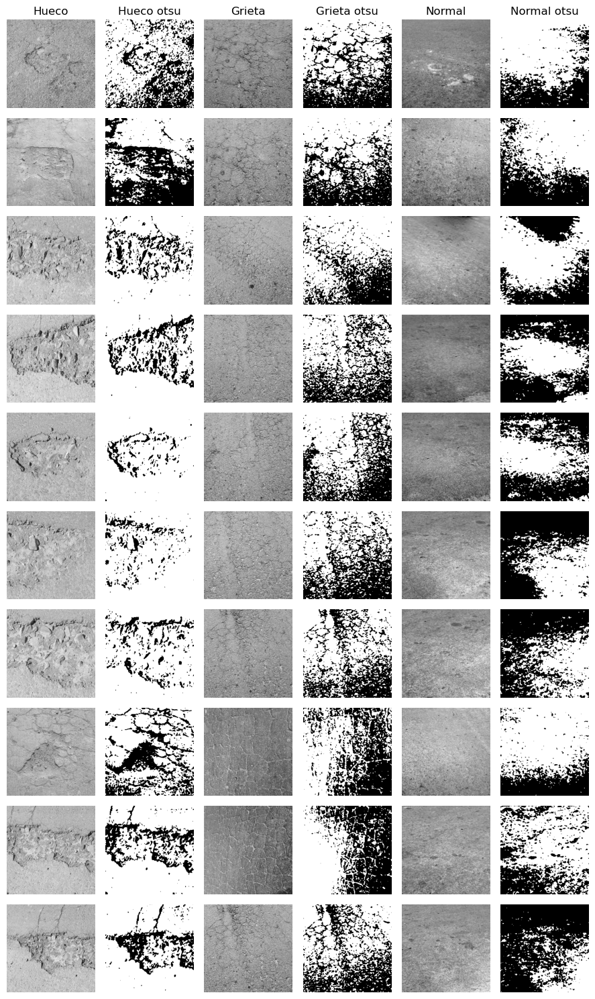

In [15]:
def otsu(imagen):
    _, otsu_result = cv2.threshold(imagen, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return otsu_result


# Aplicamos otsu a cada conjunto de imágenes
imagen_huecos_otsu = [otsu(imagen) for imagen in imagen_huecos_blur]
imagen_grietas_otsu = [otsu(imagen) for imagen in imagen_grietas_blur]
imagen_normal_otsu = [otsu(imagen) for imagen in imagen_normal_blur]

mostrar = [huecos[inicio:final], imagen_huecos_otsu[inicio:final],
           grietas[inicio:final], imagen_grietas_otsu[inicio:final],
           normal[inicio:final], imagen_normal_otsu[inicio:final]]

nombres = ['Hueco', 'Hueco otsu', 'Grieta', 'Grieta otsu', 'Normal', 'Normal otsu']

show_images(mostrar, nombres, size=1.5)


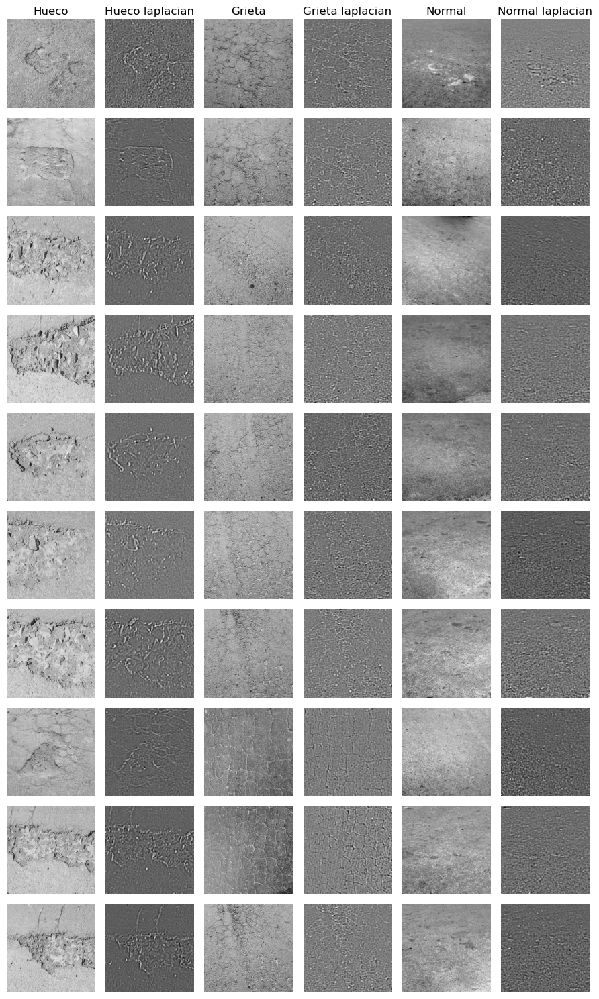

In [16]:
def laplacian(imagen):
    return cv2.Laplacian(imagen, cv2.CV_64F, ksize=9)

# Aplicamos Sobel a cada conjunto de imágenes
imagen_huecos_laplacian = [laplacian(imagen) for imagen in imagen_huecos_blur]
imagen_grietas_laplacian = [laplacian(imagen) for imagen in imagen_grietas_blur]
imagen_normal_laplacian = [laplacian(imagen) for imagen in imagen_normal_blur]

mostrar = [huecos[inicio:final], imagen_huecos_laplacian[inicio:final],
           grietas[inicio:final], imagen_grietas_laplacian[inicio:final],
           normal[inicio:final], imagen_normal_laplacian[inicio:final]]

nombres = ['Hueco', 'Hueco laplacian', 'Grieta', 'Grieta laplacian', 'Normal', 'Normal laplacian']

show_images(mostrar, nombres, size=1.5)

## En base a lo previo, decidimos continuar el exploratorio con el uso del filtro Sobel.

## Calculamos características con sift y orb

In [ ]:
# Cambiamos el formato de las imagenes
imagen_huecos_sobel = [imagen.astype(np.uint8) for imagen in imagen_huecos_sobel]
imagen_grietas_sobel = [imagen.astype(np.uint8) for imagen in imagen_grietas_sobel]
imagen_normal_sobel = [imagen.astype(np.uint8) for imagen in imagen_normal_sobel]

In [18]:
sift = cv2.SIFT_create()

# Detectar y computar descriptores
descriptores_huecos = [sift.detectAndCompute(imagen, None) for imagen in imagen_huecos_sobel]
descriptores_grietas = [sift.detectAndCompute(imagen, None) for imagen in imagen_grietas_sobel]
descriptores_normal = [sift.detectAndCompute(imagen, None) for imagen in imagen_normal_sobel]

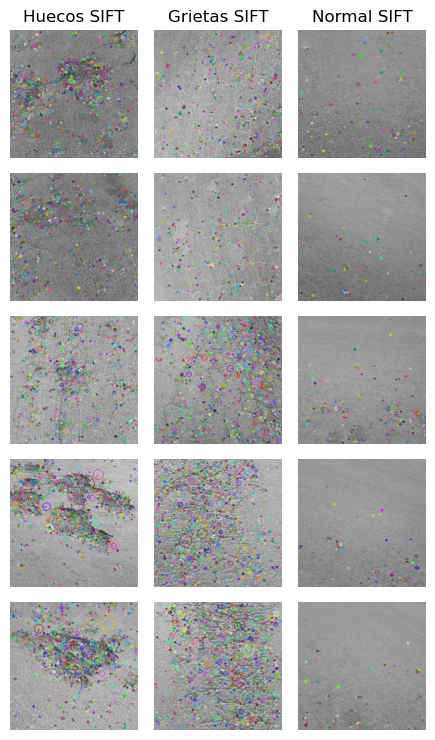

In [19]:
# Generamos las imágenes con los keypoints dibujados
imagenes_huecos_sift = [cv2.drawKeypoints(huecos[i], descriptores_huecos[i][0], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) for i in range(5)]
imagenes_grietas_sift = [cv2.drawKeypoints(grietas[i], descriptores_grietas[i][0], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) for i in range(5)]
imagenes_normal_sift = [cv2.drawKeypoints(normal[i], descriptores_normal[i][0], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) for i in range(5)]

# Usamos la función show_images
mostrar = [imagenes_huecos_sift, imagenes_grietas_sift, imagenes_normal_sift]
nombres = ['Huecos SIFT', 'Grietas SIFT', 'Normal SIFT']

show_images(mostrar, nombres, size=1.5)


In [20]:
orb = cv2.ORB_create()

# Detectar y computar descriptores con ORB
descriptores_huecos_orb = [orb.detectAndCompute(imagen, None) for imagen in imagen_huecos_sobel]
descriptores_grietas_orb = [orb.detectAndCompute(imagen, None) for imagen in imagen_grietas_sobel]
descriptores_normal_orb = [orb.detectAndCompute(imagen, None) for imagen in imagen_normal_sobel]

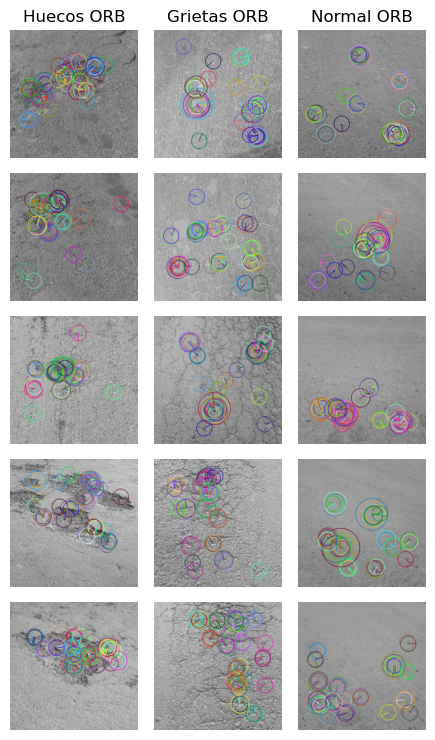

In [21]:
# Función para quedarnos con los keypoints más importantes
def top_keypoints(kps, n=50):
    kps_ordenados = sorted(kps, key=lambda kp: kp.response, reverse=True)
    return kps_ordenados[:n]

# Generamos las imágenes con los keypoints dibujados
imagenes_huecos_orb = [
    cv2.drawKeypoints(huecos[i], top_keypoints(descriptores_huecos_orb[i][0]), None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    for i in range(5)
]
imagenes_grietas_orb = [
    cv2.drawKeypoints(grietas[i], top_keypoints(descriptores_grietas_orb[i][0]), None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    for i in range(5)
]
imagenes_normal_orb = [
    cv2.drawKeypoints(normal[i], top_keypoints(descriptores_normal_orb[i][0]), None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    for i in range(5)
]

# Mostrar las imágenes
mostrar = [imagenes_huecos_orb, imagenes_grietas_orb, imagenes_normal_orb]
nombres = ['Huecos ORB', 'Grietas ORB', 'Normal ORB']

show_images(mostrar, nombres, size=1.5)


## Bag of Visual Words (BoVW) 
Para lo siguiente, se decidió utilizar el detector de SIFT, con el propósito de optimizar seleccionamos los descriptores relacionados a los keypoints con mayor valor de response

In [23]:
# Filtro de puntos clave y descriptores con mayor respuesta
def filtrar_puntos_y_descriptores_mas_significativos(det_desc_list, top_n=1000):
    puntos_clave_filtrados = []
    descriptores_filtrados = []
    for keypoints, descriptors in det_desc_list:
        if keypoints is None or descriptors is None or len(keypoints) == 0:
            puntos_clave_filtrados.append([])
            descriptores_filtrados.append(np.zeros((1, 128), dtype=np.float32))
            continue

        # Ordenar por respuesta
        indices_ordenados = sorted(range(len(keypoints)), key=lambda i: keypoints[i].response, reverse=True)
        indices_top = indices_ordenados[:min(top_n, len(keypoints))]

        # Seleccionar keypoints y descriptores filtrados
        puntos_clave_filtrados.append([keypoints[i] for i in indices_top])
        descriptores_filtrados.append(descriptors[indices_top])
        
    return puntos_clave_filtrados, descriptores_filtrados

# Aplicar el filtro a cada conjunto
top_kp_huecos, top_desc_huecos = filtrar_puntos_y_descriptores_mas_significativos(descriptores_huecos, top_n=500)
top_kp_grietas, top_desc_grietas = filtrar_puntos_y_descriptores_mas_significativos(descriptores_grietas, top_n=500)
top_kp_normal, top_desc_normal = filtrar_puntos_y_descriptores_mas_significativos(descriptores_normal, top_n=500)

In [24]:
#concatenamos los descriptores en uno solo
all_descriptors = top_desc_huecos + top_desc_grietas + top_desc_normal
all_descriptors = np.vstack(all_descriptors)

print(len(all_descriptors))

1521567


Calculando KMeans y Silhouette (sample): 100%|██████████| 10/10 [01:50<00:00, 11.01s/it]


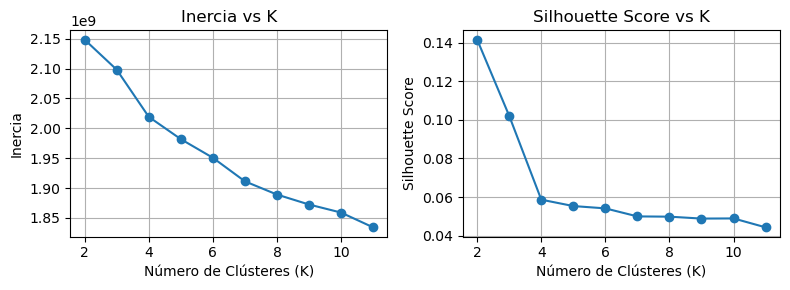

In [25]:
#miramos que número de clusteres es optimo para el proceso

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tqdm import tqdm

inertia = []
silhouette_scores = []
k_values = range(2, 12)

from sklearn.utils import shuffle

muestra = shuffle(all_descriptors, random_state=70)[:20000]  # reduce datos de entrenamiento

for k in tqdm(k_values, desc="Calculando KMeans y Silhouette (sample)"):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(muestra)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(muestra, kmeans.labels_))



# Graficamos la inercia y el coeficiente de silueta
plt.figure(figsize=(8, 3)) 
plt.subplot(1, 2, 1)
plt.plot(k_values, inertia, marker='o')
plt.title('Inercia vs K')
plt.xlabel('Número de Clústeres (K)')
plt.ylabel('Inercia')
plt.grid()

plt.subplot(1, 2, 2)
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs K')
plt.xlabel('Número de Clústeres (K)')
plt.ylabel('Silhouette Score')
plt.grid()

plt.tight_layout()
plt.show()


In [26]:
#tomamos el k encontrado
k = 4
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(all_descriptors)

KMeans(n_clusters=4, random_state=42)

In [27]:
#definomos una función que recibe los descriptores de una imagen y devuelve el bovw correspondiente en base a sus descriptores
def get_bovw_features(kmeans, image_descriptors, vocab_size):
    bovw_features = []
    for descriptors in image_descriptors:
        if descriptors is None or descriptors.shape[0] == 0:
            hist = np.zeros(vocab_size)
        else:
            labels = kmeans.predict(descriptors)
            hist, _ = np.histogram(labels, bins=np.arange(vocab_size+1))
        bovw_features.append(hist)
    return np.array(bovw_features)

In [28]:
descriptores_imagenes = top_desc_huecos + top_desc_grietas + top_desc_normal

In [29]:
X = get_bovw_features(kmeans, descriptores_imagenes, k)
print(X[0])
print(len(X))

[ 78 120 147 155]
4445


In [30]:
#Codificamos las clases
from sklearn.preprocessing import LabelEncoder
# Codificar etiquetas
le = LabelEncoder()
y = le.fit_transform(df['clase'])  

In [32]:
#definomos el entrenamiento para XGBoost
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, stratify=y, test_size=0.3, random_state=42)

model = XGBClassifier(
    n_estimators=100,        # Número de árboles 
    max_depth=5,             # Profundidad máxima de cada árbol
    learning_rate=0.1,       # Tasa de aprendizaje
)

model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [33]:
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred, target_names=le.classes_))

print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

      grieta       0.64      0.59      0.61       444
       hueco       0.80      0.89      0.84       445
      normal       0.71      0.70      0.71       445

    accuracy                           0.72      1334
   macro avg       0.72      0.72      0.72      1334
weighted avg       0.72      0.72      0.72      1334

[[260  71 113]
 [ 37 395  13]
 [108  26 311]]


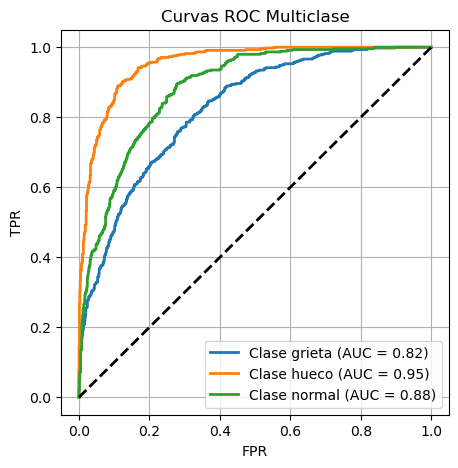

In [40]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# Binarizar etiquetas para formato One-vs-Rest
classes = np.unique(y)
y_test_bin = label_binarize(y_test, classes=classes)
y_score = model.predict_proba(X_test)

# Calcular curva ROC por clase
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(5, 5))
for i in range(3):
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'Clase {le.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Curvas ROC Multiclase')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()
